<a href="https://colab.research.google.com/github/franckbinde/feline_classifier/blob/main/Feline_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning/Computer Vision Project: Feline Classifier

## Tiger, Cheetah or Serval

In this project, we will create a deep learning model to classify feline images. The end goal is to distinguish between 3 feline types: Tiger, Cheetah and Serval.

In [ ]:
#NB: Kaggle requires phone verification to use the internet or a GPU. If you haven't done that yet, the cell below will fail
#    This code is only here to check that your internet is enabled. It doesn't do anything else.
#    Here's a help thread on getting your phone number verified: https://www.kaggle.com/product-feedback/135367

import socket,warnings
try:
    socket.setdefaulttimeout(1)
    socket.socket(socket.AF_INET, socket.SOCK_STREAM).connect(('1.1.1.1', 53))
except socket.error as ex: raise Exception("STOP: No internet. Click '>|' in top right and set 'Internet' switch to on")

In [ ]:
#|export
# It's a good idea to ensure you're running the latest version of any libraries you need.
# `!pip install -Uqq <libraries>` upgrades to the latest version of <libraries>
# NB: You can safely ignore any warnings or errors pip spits out about running as root or incompatibilities
'''import os
iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

if iskaggle:'''
!pip install -Uqq fastai

## Step 1: Download images of bears

In [ ]:
# Skip this cell if you already have duckduckgo_search installed
!pip install -Uqq duckduckgo_search

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 36.7 MB/s eta 0:00:00


In [ ]:
from duckduckgo_search import DDGS
from fastcore.all import *

def search_images(term, max_images=150):
  with DDGS() as ddgs:
    results = L(ddgs.images(keywords=term)) # Use the images method of the DDGS class
  return results.itemgot('image')[:max_images] # Limit the number of images to max_images


In [ ]:
ims = search_images('tiger', max_images=1)
ims[0]

'http://upload.wikimedia.org/wikipedia/commons/c/c6/Siberian_Tiger_sf.jpg'

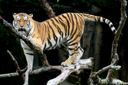

In [ ]:
from fastdownload import download_url
dest = 'images/tiger.jpg'
download_url(ims[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(128,128)

In [ ]:
feline_types = 'tiger', 'cheetah', 'serval'
path = Path('feline_types')

In [ ]:
if not path.exists():
  path.mkdir()
  for feline in feline_types:
    dest = (path/feline)
    dest.mkdir(exist_ok=True)
    #results = search_images(f"{bear} bear")
    #results = search_images(feline)
    #download_images(dest, urls=search_images(f'{bear} bear'))
    download_images(dest, urls=search_images(f'{feline} animal'))

In [ ]:
# download_url(search_images('condominium photos', max_images=1)[0], 'condo.jpg', show_progress=False)
# Image.open('condo.jpg').to_thumb(256,256)

In [ ]:
'''searches = 'condominium', 'beach'
path = Path('beach_or_not')
from time import sleep

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images(f'{o} sun photo'))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} shade photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)'''

"searches = 'condominium', 'beach'\npath = Path('beach_or_not')\nfrom time import sleep\n\nfor o in searches:\n    dest = (path/o)\n    dest.mkdir(exist_ok=True, parents=True)\n    download_images(dest, urls=search_images(f'{o} photo'))\n    sleep(10)  # Pause between searches to avoid over-loading server\n    download_images(dest, urls=search_images(f'{o} sun photo'))\n    sleep(10)\n    download_images(dest, urls=search_images(f'{o} shade photo'))\n    sleep(10)\n    resize_images(path/o, max_size=400, dest=path/o)"

## Step 2: Train our model

In [ ]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

7

In [ ]:
'''dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path)

dls.show_batch(max_n=6)'''
felines = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [ ]:
dls = felines.dataloaders(path)

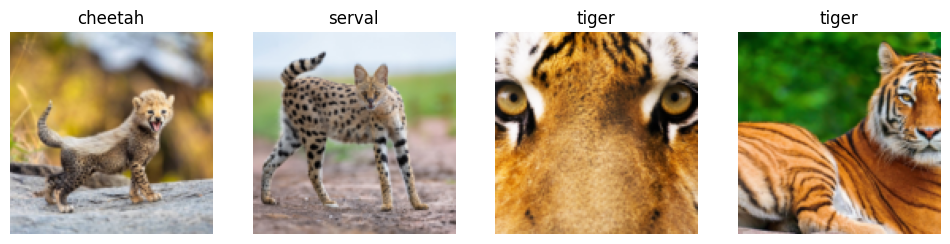

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

In [ ]:
'''felines = felines.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = felines.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)'''

'felines = felines.new(item_tfms=Resize(128, ResizeMethod.Squish))\ndls = felines.dataloaders(path)\ndls.valid.show_batch(max_n=4, nrows=1)'

In [ ]:
'''felines = felines.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = felines.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)'''

"felines = felines.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))\ndls = felines.dataloaders(path)\ndls.valid.show_batch(max_n=4, nrows=1)"

In [ ]:
'''felines = felines.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = felines.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)'''

'felines = felines.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))\ndls = felines.dataloaders(path)\ndls.train.show_batch(max_n=4, nrows=1, unique=True)'

In [ ]:
'''felines = felines.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = felines.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)'''

'felines = felines.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))\ndls = felines.dataloaders(path)\ndls.train.show_batch(max_n=8, nrows=2, unique=True)'

We don't have a lot of data for our problem (150 pictures of each sort of bear at most), so to train our model, we'll use RandomResizedCrop with an image size of 224 px, which is fairly standard for image classification, and default aug_transforms:

In [ ]:
felines = felines.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = felines.dataloaders(path)

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 51.1MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.861329,1.759064,0.403846,00:13


epoch,train_loss,valid_loss,error_rate,time
0,0.540104,0.497255,0.173077,00:13
1,0.393206,0.210253,0.057692,00:14
2,0.267896,0.208843,0.057692,00:12
3,0.206901,0.205545,0.057692,00:13


Now let's see the mistakes made by the model. To visualize this, we can create a confusion matrix:

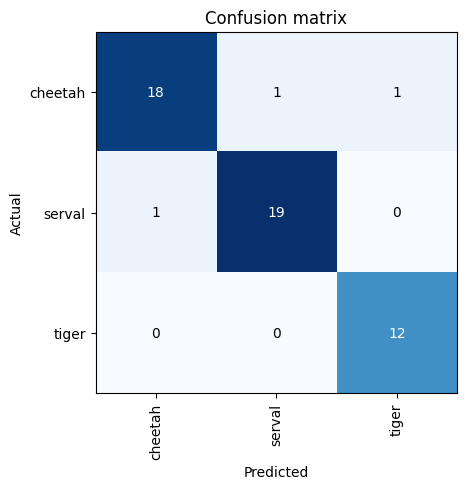

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

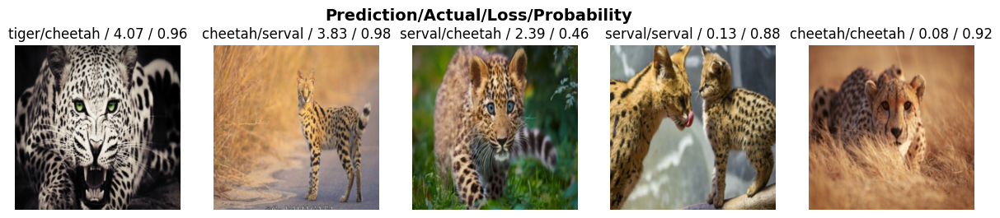

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
!pip install fastai
from fastai.vision.all import *
from fastai.vision.widgets import ImageClassifierCleaner # imports ImageClassifierCleaner from fastai.vision.widgets

#assigns ImageClassifierCleaner from fastai.vision.widgets to the cleaner variable.
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
dls = felines.dataloaders(path)

In [ ]:
learn.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,0.006140,0.246480,0.076923,00:14


epoch,train_loss,valid_loss,error_rate,time
0,0.017840,0.222592,0.057692,00:14
1,0.027574,0.346409,0.057692,00:13
2,0.028025,0.337265,0.057692,00:13


# Turning the Model into an Application

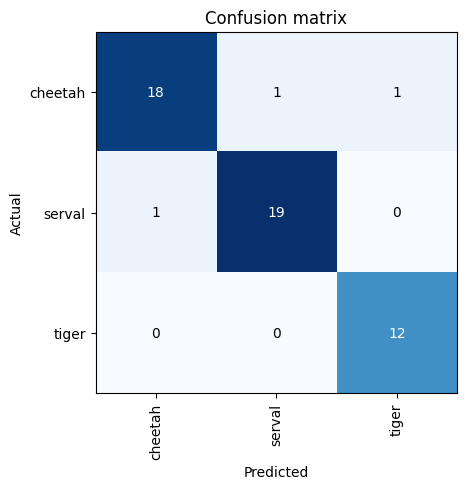

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

In [ ]:
model = load_learner(path/'export.pkl')

In [ ]:
%time model.predict('images/tiger.jpg')

CPU times: user 183 ms, sys: 17.7 ms, total: 201 ms
Wall time: 223 ms


('tiger', tensor(2), tensor([9.6515e-06, 3.2482e-05, 9.9996e-01]))

In [ ]:
model.dls.vocab

['cheetah', 'serval', 'tiger']